# Model testing and final evaluation

## Overview

This notebook focuses on evaluating the performance of the previously trained garbage classification models. No additional training is performed at this stage. Instead, the saved models are loaded and used only for inference on unseen data.

The evaluation is divided into two phases:

#### Phase 1 – Real-world image testing

The first phase focuses on testing the model using real-life images collected during everyday situations while disposing of waste. These images were captured randomly and represent realistic conditions that differ from the original training dataset. The goal of this phase is to observe how well the model generalizes to real-world scenarios involving varying backgrounds, lighting conditions, and object positions.

#### Phase 2 – Hold-out test set evaluation

The second phase evaluates the model on the previously separated **15% hold-out test set**. This subset was isolated before cross-validation and was never used during training. Using this unseen dataset allows for a more objective assessment of model performance while preserving the original data distribution.

We start with import of libraries, as always.

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import json
import torch
import torch.nn.functional as F
from PIL import Image
from transformers import AutoImageProcessor, AutoModelForImageClassification
from collections import defaultdict
from datasets import load_dataset

Training information was retrieved from the saved checkpoint folders generated during the training process. For each fold, the code reads the trainer_state.json file and extracts logged metrics collected during training. Two plots were created. The first plot presents training loss over training steps, showing how the model error changed during learning. A decreasing loss indicates that the model was gradually improving its ability to fit the training data. The second plot presents validation accuracy over epochs, allowing performance comparison across folds on unseen validation data.

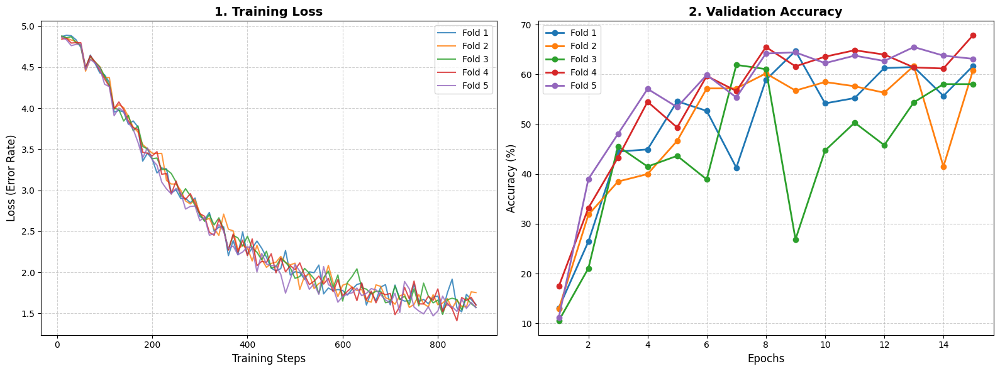

In [2]:
# 224x224 model 
plt.figure(figsize=(16, 6))
ax1 = plt.subplot(1, 2, 1)
ax2 = plt.subplot(1, 2, 2)

folds = 5
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

for i in range(1, folds + 1):
    fold_dir = f"./garbage_model_fold_{i}"

    if not os.path.exists(fold_dir):
        print(f"Could not find folder: {fold_dir}")
        continue

    # logs inside 'checkpoint-XXX' folders
    checkpoints = [d for d in os.listdir(fold_dir) if d.startswith("checkpoint")]
    if not checkpoints:
        print(f"No checkpoints found in {fold_dir}")
        continue

    checkpoints.sort(key=lambda x: int(x.split("-")[1]))
    latest_checkpoint = checkpoints[-1]

    state_path = os.path.join(fold_dir, latest_checkpoint, "trainer_state.json")

    if os.path.exists(state_path):
        with open(state_path, "r") as f:
            state = json.load(f)

        log_history = state["log_history"]

        # Loss for every 10 steps (logging_steps=10)
        train_steps = [log["step"] for log in log_history if "loss" in log]
        train_loss = [log["loss"] for log in log_history if "loss" in log]

        # Accuracy per each epoch
        eval_epochs = [log["epoch"] for log in log_history if "eval_accuracy" in log]
        eval_acc = [log["eval_accuracy"] * 100 for log in log_history if "eval_accuracy" in log] 

        ax1.plot(train_steps, train_loss, color=colors[i-1], alpha=0.8, label=f"Fold {i}")
        ax2.plot(eval_epochs, eval_acc, color=colors[i-1], marker='o', linewidth=2, label=f"Fold {i}")

# Training Loss
ax1.set_title("1. Training Loss", fontsize=14, fontweight='bold')
ax1.set_xlabel("Training Steps", fontsize=12)
ax1.set_ylabel("Loss (Error Rate)", fontsize=12)
ax1.grid(True, linestyle='--', alpha=0.6)
ax1.legend()

# Validation Accuracy 
ax2.set_title("2. Validation Accuracy", fontsize=14, fontweight='bold')
ax2.set_xlabel("Epochs", fontsize=12)
ax2.set_ylabel("Accuracy (%)", fontsize=12)
ax2.grid(True, linestyle='--', alpha=0.6)
ax2.legend()

plt.tight_layout()
plt.show()

Learning rates for all 5 folds are quite smooth. It proves that our 5e-5 learning rate and our warmup_ratio=0.1 were the good settings for fine-tuning the EfficientNet. Taking into consideration convergence, by the end of the steps (around the 500 mark), the lines flatten out near the bottom. This means the model has squeezed almost all the useful information it can out of the training data.

Looking at the Validation Accuracy chart, all five folds start low (around 20-40%) and climb steadily together up to the 60-70% range. Average Accuracy across all 5 folds is 64.36% and standard deviation around 2.31%. The number of epochs between 10 and 15 was alos a good choice. The lines for the different folds plateau arond the 10th epoch and mostly keep this level of accuracy till epoch 15. 

Based on the graphs, we can conclude that 224x224 model is robust and learning consistently across every possible slice of the dataset. 

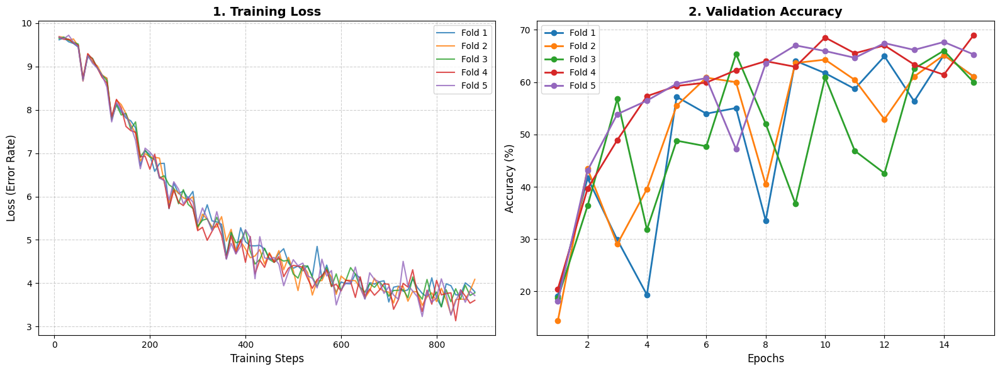

In [3]:
# 448x448 model
plt.figure(figsize=(16, 6))
ax1 = plt.subplot(1, 2, 1)
ax2 = plt.subplot(1, 2, 2)

folds = 5
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

for i in range(1, folds + 1):
    fold_dir = f"./garbage_model_448_fold_{i}"

    if not os.path.exists(fold_dir):
        print(f"Could not find folder: {fold_dir}")
        continue

    # logs inside 'checkpoint-XXX' folders
    checkpoints = [d for d in os.listdir(fold_dir) if d.startswith("checkpoint")]
    if not checkpoints:
        print(f"No checkpoints found in {fold_dir}")
        continue

    checkpoints.sort(key=lambda x: int(x.split("-")[1]))
    latest_checkpoint = checkpoints[-1]

    state_path = os.path.join(fold_dir, latest_checkpoint, "trainer_state.json")

    if os.path.exists(state_path):
        with open(state_path, "r") as f:
            state = json.load(f)

        log_history = state["log_history"]

        # Loss for every 10 steps (logging_steps=10)
        train_steps = [log["step"] for log in log_history if "loss" in log]
        train_loss = [log["loss"] for log in log_history if "loss" in log]

        # Accuracy per each epoch
        eval_epochs = [log["epoch"] for log in log_history if "eval_accuracy" in log]
        eval_acc = [log["eval_accuracy"] * 100 for log in log_history if "eval_accuracy" in log] 

        ax1.plot(train_steps, train_loss, color=colors[i-1], alpha=0.8, label=f"Fold {i}")
        ax2.plot(eval_epochs, eval_acc, color=colors[i-1], marker='o', linewidth=2, label=f"Fold {i}")

# Training Loss
ax1.set_title("1. Training Loss", fontsize=14, fontweight='bold')
ax1.set_xlabel("Training Steps", fontsize=12)
ax1.set_ylabel("Loss (Error Rate)", fontsize=12)
ax1.grid(True, linestyle='--', alpha=0.6)
ax1.legend()

# Validation Accuracy 
ax2.set_title("2. Validation Accuracy", fontsize=14, fontweight='bold')
ax2.set_xlabel("Epochs", fontsize=12)
ax2.set_ylabel("Accuracy (%)", fontsize=12)
ax2.grid(True, linestyle='--', alpha=0.6)
ax2.legend()

plt.tight_layout()
plt.show()

Now lets analyze the training process for the model with increased resolution to 448x448. The same as 224x224 model, the training loss drops fast and smooth, approaching near-zero very quickly. This tells us the model had no problem memorizing the training data. The higher resolution gave it so much detail that it easily found unique features for every single image.

However, we can notice a claer difference for the accuracy scores acros the folds and epochs. Average Accuracy across all 5 folds is 66.60% and standard deviation around 1.50%. Notice how the accuracy peaks early (around epochs 2-4) mostly for the folds 1,2 and 3, hitting roughly 60-70%. But then, as training continues, the accuracy drops and becomes unstable. This could happen because the model was given so much fine detail, it started memorizing noise and specific quirks of the training images (like the exact background of a specific bottle) rather than learning the general shapes of the garbage. When it was tested on the validation set, those hyper-specific details weren't there, so its guesses became worse. If we Look at the wide spread between the lines compared to the tight grouping of your 224x224 model, fold 3 (green) crashes down to below 65%, while Fold 4 (red) stays near 70%. This instability is a major warning sign that the model is no longer generalizing well.

### Testing on real images

From our experiment we can see that simply increasing the image resolution from 224x224 to 448x448 decreased the overall stability and generalization of the model, leading to overfitting. The 224x224 model, while lower resolution, was forced to learn general shapes and edges because it couldn't rely on tiny details, making it much more robust when looking at new, unseen garbage.

We decided to conduct testing in two phases. The first phase focused on evaluating the model using real-life images collected during everyday situations while disposing of waste. These images were captured naturally and selected randomly to reflect realistic usage conditions.

Loading weights:   0%|          | 0/360 [00:00<?, ?it/s]

Model loaded

Found 21 real-world images. Starting classification...

test18.jpeg:
Model says: SOFT PLASTICS (18.65% confident)

test14.jpeg:
Model says: HARD PLASTIC (23.68% confident)

test15.jpeg:
Model says: PAPER TOWEL (18.98% confident)

test7.jpeg:
Model says: SOFT PLASTICS (31.63% confident)

test19.jpeg:
Model says: SOFT PLASTICS (62.30% confident)

test6.jpg:
Model says: SOFT PLASTICS (63.29% confident)

test12.jpeg:
Model says: SOFT PLASTICS (34.63% confident)

test5.jpg:
Model says: GLASS (28.78% confident)

test4.jpg:
Model says: GLASS (41.69% confident)

test1.jpg:
Model says: HARD PLASTIC (45.85% confident)

test3.jpg:
Model says: SOFT PLASTICS (51.48% confident)

test13.jpeg:
Model says: SOFT PLASTICS (39.54% confident)

test2.jpg:
Model says: PAPER TOWEL (31.34% confident)

test10.jpeg:
Model says: SOFT PLASTICS (23.31% confident)

test11.jpeg:
Model says: SOFT PLASTICS (30.99% confident)

test20.jpeg:
Model says: PAPER TOWEL (41.96% confident)

test8.jpeg:
Model says:

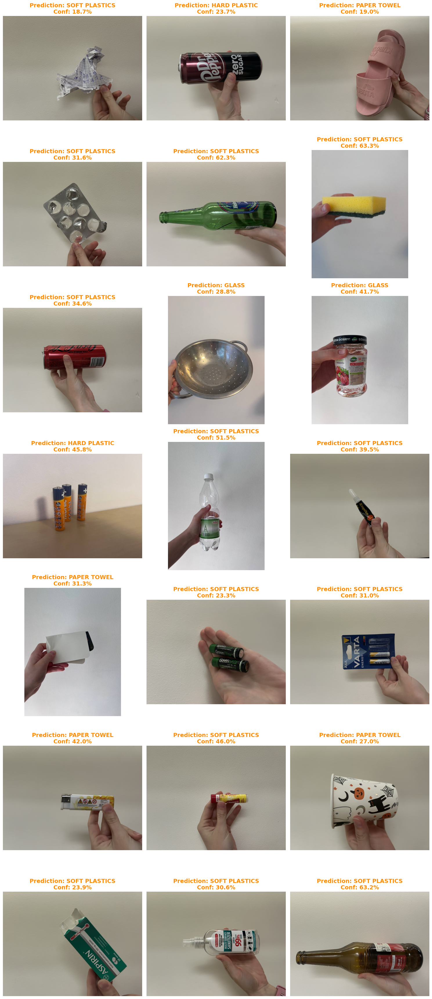

In [4]:
model_path_224 = "./best_garbage_classifier"
test_folder = "./real_images_test"

processor = AutoImageProcessor.from_pretrained(model_path_224)
model = AutoModelForImageClassification.from_pretrained(model_path_224)
print("Model loaded\n")

if not os.path.exists(test_folder):
    print(f"Error: Could not find the folder '{test_folder}'")
    exit()

valid_extensions = (".jpg", ".jpeg", ".png", ".webp")
image_files = [f for f in os.listdir(test_folder) if f.lower().endswith(valid_extensions)]

if len(image_files) == 0:
    print(f"Error: Found the folder '{test_folder}', but there are no images inside it")
    exit()

print(f"Found {len(image_files)} real-world images. Starting classification...\n")


num_images = len(image_files)
cols = 3 # Display 3 images per row
rows = (num_images + cols - 1) // cols 
plt.figure(figsize=(15, 5 * rows))


for i, filename in enumerate(image_files):
    image_path = os.path.join(test_folder, filename)
    
    raw_image = Image.open(image_path).convert("RGB")
    inputs = processor(raw_image, return_tensors="pt") # Transform it into the exact mathematical format the model expects
    
    with torch.no_grad(): # no_grad makes the model fast
        outputs = model(**inputs)

    probabilities = F.softmax(outputs.logits, dim=1)[0]
    
    best_prediction_id = torch.argmax(probabilities).item()
    confidence = probabilities[best_prediction_id].item() * 100
    predicted_label = model.config.id2label[best_prediction_id]

    print(f"{filename}:")
    print(f"Model says: {predicted_label.upper()} ({confidence:.2f}% confident)\n")
    
    plt.subplot(rows, cols, i + 1)
    plt.imshow(raw_image)
    plt.axis('off')
    
    title_color = "green" if confidence > 70 else "darkorange"
    plt.title(f"Prediction: {predicted_label.upper()}\nConf: {confidence:.1f}%", 
              fontsize=14, fontweight='bold', color=title_color)

plt.tight_layout()
plt.show()

For the 224×224 model, testing on real-world images revealed mixed performance. The model was able to produce predictions for all tested objects; however, the confidence scores remained relatively low, with most predictions falling between approximately 18% and 63%. This indicates that although the model identified patterns resembling known categories, it was often uncertain about its decisions.

Some examples showed reasonable behavior. Glass objects such as jars and bottles were correctly classified as Glass, and a sponge was classified as Soft Plastics with one of the highest confidence scores (63.3%). Flexible packaging materials and some lightweight objects were also frequently assigned to the Soft Plastics category.

However, several misclassifications can also be observed. Aluminum cans were predicted as Hard Plastic or Soft Plastics, batteries were classified as Soft Plastics, and a shoe was recognized as Paper Towel. Objects such as blister packaging and metal containers were also assigned incorrect categories. In many cases, the model showed a tendency to predict Soft Plastics, suggesting that this category may dominate visually or that the model learned broad characteristics shared across multiple object types.

These results indicate that the model performs reasonably well when encountering objects visually similar to examples from the training set, particularly for categories with distinctive features such as glass containers. However, confidence decreases considerably when presented with unusual viewpoints, mixed materials, or objects that do not closely resemble the training examples. This behavior aligns with earlier observations from cross-validation, where the model learned general patterns but still struggled with highly variable real-world inputs.

Loading weights:   0%|          | 0/360 [00:00<?, ?it/s]

Model loaded

Found 21 real-world images. Starting classification...

test18.jpeg:
Model says: ALUMINIUM (19.22% confident)

test14.jpeg:
Model says: SOFT PLASTICS (20.51% confident)

test15.jpeg:
Model says: PAPER TOWEL (21.64% confident)

test7.jpeg:
Model says: ALUMINIUM (42.85% confident)

test19.jpeg:
Model says: SOFT PLASTICS (62.32% confident)

test6.jpg:
Model says: SOFT PLASTICS (61.52% confident)

test12.jpeg:
Model says: SOFT PLASTICS (16.52% confident)

test5.jpg:
Model says: GLASS (35.14% confident)

test4.jpg:
Model says: TAKEAWAY CUPS (33.52% confident)

test1.jpg:
Model says: SOFT PLASTICS (22.92% confident)

test3.jpg:
Model says: GLASS (47.32% confident)

test13.jpeg:
Model says: SOFT PLASTICS (40.01% confident)

test2.jpg:
Model says: PAPER (20.68% confident)

test10.jpeg:
Model says: SOFT PLASTICS (26.08% confident)

test11.jpeg:
Model says: BATTERIES (27.66% confident)

test20.jpeg:
Model says: PAPER TOWEL (23.22% confident)

test8.jpeg:
Model says: SOFT PLASTICS (

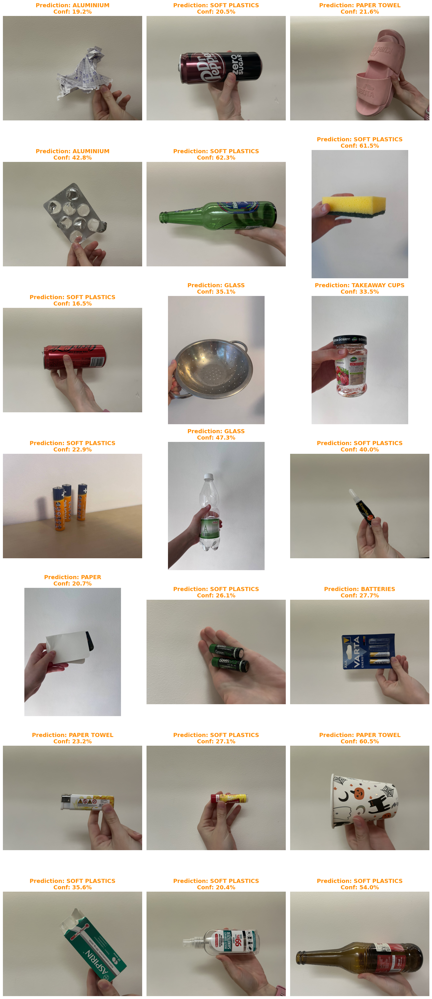

In [5]:
model_path_448 = "./model_448px_experiment"
test_folder = "./real_images_test"

processor = AutoImageProcessor.from_pretrained(model_path_448)
model = AutoModelForImageClassification.from_pretrained(model_path_448)
print("Model loaded\n")

if not os.path.exists(test_folder):
    print(f"Error: Could not find the folder '{test_folder}'")
    exit()

valid_extensions = (".jpg", ".jpeg", ".png", ".webp")
image_files = [f for f in os.listdir(test_folder) if f.lower().endswith(valid_extensions)]

if len(image_files) == 0:
    print(f"Error: Found the folder '{test_folder}', but there are no images inside it")
    exit()

print(f"Found {len(image_files)} real-world images. Starting classification...\n")


num_images = len(image_files)
cols = 3 # Display 3 images per row
rows = (num_images + cols - 1) // cols 
plt.figure(figsize=(15, 5 * rows))


for i, filename in enumerate(image_files):
    image_path = os.path.join(test_folder, filename)
    
    raw_image = Image.open(image_path).convert("RGB")
    inputs = processor(raw_image, return_tensors="pt") # Transform it into the exact mathematical format the model expects
    
    with torch.no_grad(): # no_grad makes the model fast
        outputs = model(**inputs)

    probabilities = F.softmax(outputs.logits, dim=1)[0]
    
    best_prediction_id = torch.argmax(probabilities).item()
    confidence = probabilities[best_prediction_id].item() * 100
    predicted_label = model.config.id2label[best_prediction_id]

    print(f"{filename}:")
    print(f"Model says: {predicted_label.upper()} ({confidence:.2f}% confident)\n")
    
    plt.subplot(rows, cols, i + 1)
    plt.imshow(raw_image)
    plt.axis('off')
    
    title_color = "green" if confidence > 70 else "darkorange"
    plt.title(f"Prediction: {predicted_label.upper()}\nConf: {confidence:.1f}%", 
              fontsize=14, fontweight='bold', color=title_color)

plt.tight_layout()
plt.show()

For the 448×448 model, testing on real-world images produced results that further support the observations made during the training and cross-validation stages. While the model successfully generated predictions for all images, confidence values remained relatively low and mostly ranged between approximately 16% and 62%. Similar to the 224×224 model, the classifier often showed uncertainty when encountering real-life examples.

Several predictions were correct or partially reasonable. Aluminum foil and blister packaging were classified as Aluminium, while packaged batteries were correctly identified as Batteries. Some glass-related objects were also recognized successfully, such as the metal strainer being classified as Glass and a plastic bottle receiving a Glass prediction with moderate confidence. These examples suggest that the model was still capable of detecting certain visual patterns associated with learned categories.

However, many inconsistencies were also observed. Aluminum cans were repeatedly classified as Soft Plastics, batteries held in hand were predicted as Soft Plastics, and a glass bottle was again classified as Soft Plastics. The model also showed a strong tendency toward predicting the Soft Plastics class, assigning it to a large number of visually different objects. This suggests that the model may have learned highly detailed but non-generalizable patterns during training.

Compared with the 224×224 model, the 448×448 version does not show a meaningful improvement in real-world performance. Despite using higher-resolution images, the model often relied on overly specific visual details and displayed unstable behavior across object types. This observation aligns with the earlier cross-validation analysis, where the 448×448 model achieved low training loss but exhibited larger variation between folds and weaker validation performance.

### Testing on the test dataset

To perform a final evaluation, the previously separated 15% hold-out test set was used. This subset had been isolated before the cross-validation stage and was never included during training, ensuring that the evaluation was performed on genuinely unseen images.

The code first recreates the original train–test split using the same stratified sampling strategy and fixed random seed (seed=42). Using the same seed guarantees reproducibility and reconstructs the exact test subset used during the original experiment.

Next, the saved model (best_garbage_classifier) and its corresponding image processor are loaded. No retraining is performed, the model is used only in inference mode. Each image from the unseen test set is preprocessed and passed through the classifier to generate predictions. 

For each sample, the predicted label is compared with the true label, and the number of correct predictions is recorded. Final accuracy is then computed as the proportion of correctly classified images relative to the total number of test samples.

In [6]:
# Recreate original split
data_dir = "./trash_images"

dataset = load_dataset("imagefolder", data_dir=data_dir)
data = dataset["train"]

split_data = data.train_test_split(
    test_size=0.15,
    stratify_by_column="label",
    seed=42
)

test = split_data["test"]

# Load trained model
model_path = "./best_garbage_classifier"

processor = AutoImageProcessor.from_pretrained(model_path)
model = AutoModelForImageClassification.from_pretrained(model_path)

id2label = model.config.id2label

# Evaluate unseen images
correct = 0

for sample in test:

    image = sample["image"]
    true_label = id2label[sample["label"]]

    inputs = processor(
        images=image,
        return_tensors="pt"
    )

    with torch.no_grad():
        outputs = model(**inputs)

    pred = outputs.logits.argmax(-1).item()
    pred_label = id2label[pred]

    if pred_label == true_label:
        correct += 1

accuracy = correct / len(test)

print("Final Test Accuracy:", accuracy)

Resolving data files:   0%|          | 0/2734 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/360 [00:00<?, ?it/s]

Final Test Accuracy: 0.708029197080292


The model achieved a final test accuracy of 70.8%, meaning it correctly classified around 7 out of 10 images. This result suggests that the model learned meaningful patterns and was able to generalize reasonably well to unseen examples from the original dataset.

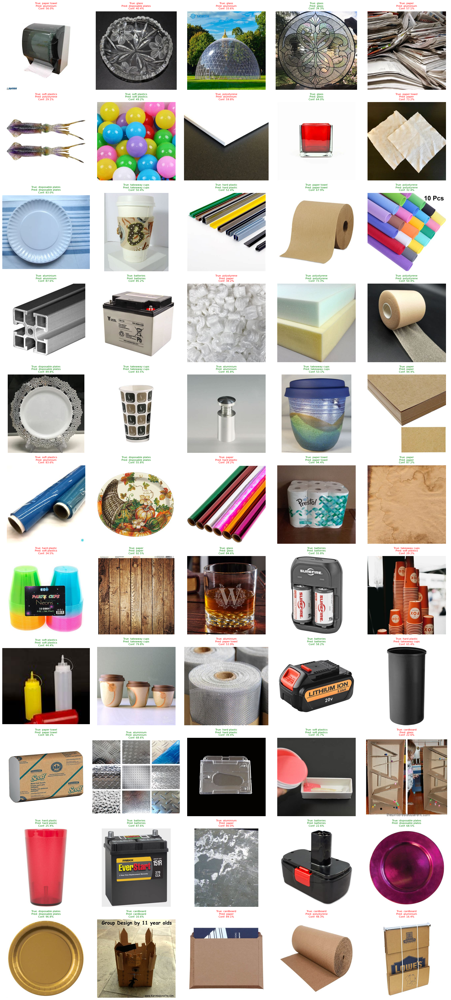

In [7]:
shown_per_class = defaultdict(int)
max_images_per_class = 5

selected_images = []

for sample in test:

    true_label = id2label[sample["label"]]

    if shown_per_class[true_label] >= max_images_per_class:
        continue

    image = sample["image"]

    inputs = processor(
        images=image,
        return_tensors="pt"
    )

    with torch.no_grad():
        outputs = model(**inputs)

    probs = F.softmax(outputs.logits, dim=-1)

    pred_idx = probs.argmax(-1).item()
    pred_label = id2label[pred_idx]
    confidence = probs[0][pred_idx].item() * 100

    selected_images.append(
        (image, true_label, pred_label, confidence)
    )

    shown_per_class[true_label] += 1

    if all(
        count >= max_images_per_class
        for count in shown_per_class.values()
    ):
        break


# Plot all images together
num_images = len(selected_images)
cols = 5
rows = (num_images + cols - 1) // cols

plt.figure(figsize=(20, 4 * rows))

for i, (image, true_label, pred_label, confidence) in enumerate(selected_images):

    plt.subplot(rows, cols, i + 1)
    plt.imshow(image)
    plt.axis("off")

    color = "green" if true_label == pred_label else "red"

    plt.title(
        f"True: {true_label}\n"
        f"Pred: {pred_label}\n"
        f"Conf: {confidence:.1f}%",
        fontsize=8,
        color=color
    )

plt.tight_layout()
plt.show()

Correct predictions are shown in green, while incorrect classifications are highlighted in red, allowing visual inspection of model behavior across different classes.

The results show that the model performs well for categories with distinctive visual features, such as glass, paper towel, cardboard, and some takeaway cup examples, where predictions are often correct and confidence scores are relatively high. However, several classes remain challenging. Misclassifications frequently occur between visually similar categories, particularly among soft plastics, hard plastic, paper, and paper towel. The model also occasionally confuses material-based categories with object-based categories, for example predicting paper instead of takeaway cups or soft plastics instead of batteries.

Confidence scores vary considerably across examples, indicating differences in prediction certainty. Images with simpler backgrounds and more distinctive object characteristics generally produce stronger confidence values, while complex textures or visually ambiguous objects lead to lower confidence and more classification errors.

Overall, these results suggest that the model learned meaningful visual patterns and achieved reasonable generalization on unseen data, while still struggling with categories that share overlapping visual characteristics. This observation is consistent with earlier findings from both cross-validation and real-world testing experiments.

## Summary

The main objective of this project was to develop an image classification system capable of recognizing different categories of garbage using deep learning techniques. The project focused on classifying waste into 11 categories, including materials such as glass, cardboard, plastics, batteries, and takeaway items. The motivation behind the project was the growing importance of proper waste segregation and the potential role of artificial intelligence in supporting more efficient recycling processes.

During the project, transfer learning was applied using an EfficientNet-based image classification model. A stratified train–test split was created, and 5-fold cross-validation was used to improve model evaluation and reduce the risk of overfitting. Two image resolutions, **224×224** and **448×448**, were tested to investigate whether higher-resolution inputs could improve classification performance.

The experiments showed that increasing image resolution did not necessarily lead to better results. Although the 448×448 model achieved very low training loss, it showed signs of overfitting and less stable validation performance. In contrast, the **224×224 model** demonstrated more consistent behavior and better generalization across folds.

Model performance was evaluated in two ways: using real-world images and using a previously separated unseen hold-out test set. Testing on real-life examples showed that the model was able to produce meaningful predictions, although confidence scores were often lower due to differences in image quality, backgrounds, and object appearance. Evaluation on the unseen test set resulted in a final accuracy of approximately **70.8%**, indicating that the model successfully learned relevant visual patterns and generalized reasonably well to new data.

Overall, the project demonstrated that deep learning can be effectively applied to waste classification problems. At the same time, the results highlighted challenges related to visually similar categories and real-world variability. Future improvements could include expanding the dataset, balancing difficult classes, and increasing the diversity of training examples to improve robustness and classification accuracy.

## Resources

1. Materials from "Image Recognition" lab classes 
2. https://huggingface.co/transformers/v3.0.2/model_doc/auto.html <br>
3. https://huggingface.co/docs/transformers/model_doc/auto <br>
4. https://huggingface.co/datasets/viola77data/recycling-dataset <br>
5. https://huggingface.co/google/efficientnet-b0 <br>
6. https://github.com/tensorflow/tpu/blob/master/models/official/efficientnet/README.md <br>
7. https://huggingface.co/docs/transformers/main_classes/trainer
